In [2]:
import numpy as np
import torch
import random
import csv
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
from tqdm import tqdm
# 데이터 로드 함수
def load_data(filepath):
    with open(filepath, mode='r', newline='') as file:
        data = [list(map(float, row)) for row in csv.reader(file)]
    tensor_data = torch.tensor(data, dtype=torch.float32)
    return tensor_data

# 경로 시각화 함수
def plot_path(path, coordinates):
    coordinates = coordinates.numpy()
    path = np.array(path + [path[0]])
    plt.figure(figsize=(10, 10))
    plt.plot(coordinates[path, 0], coordinates[path, 1], 'o-')
    plt.xlabel('X coordinate')
    plt.ylabel('Y coordinate')
    plt.title('Optimized Path')
    plt.show()

# 거리 계산 함수
def distance(city1, city2):
    return np.linalg.norm(city1 - city2)

# 비용 계산 함수
def calculate_cost(path, coordinates):
    return np.sum([distance(coordinates[path[i]], coordinates[path[i+1]]) for i in range(len(path)-1)])

# Nearest Neighbor 알고리즘을 사용한 초기 경로 생성 함수
def nearest_neighbor(cities):
    num_cities = len(cities)
    unvisited_cities = set(range(1, num_cities))
    current_city = 0
    tour = [current_city]
    while unvisited_cities:
        nearest_city = min(unvisited_cities, key=lambda city: distance(cities[current_city], cities[city]))
        tour.append(nearest_city)
        unvisited_cities.remove(nearest_city)
        current_city = nearest_city
    tour.append(0)
    return tour

# 유전 알고리즘의 변이 연산 함수
def mutate(path, mutation_rate):
    new_path = path[:]
    num_cities = len(path)
    for _ in range(int((num_cities - 2) * mutation_rate)):
        swap_idx1, swap_idx2 = random.sample(range(1, num_cities - 1), 2)
        new_path[swap_idx1], new_path[swap_idx2] = new_path[swap_idx2], new_path[swap_idx1]
    return new_path

# 유전 알고리즘의 교차 연산 함수
def crossover(parent1, parent2):
    size = len(parent1)
    start, end = sorted(random.sample(range(size), 2))
    child = [None] * size
    child[start:end] = parent1[start:end]
    ptr = end
    for city in parent2:
        if city not in child:
            if ptr >= size:
                ptr = 0
            child[ptr] = city
            ptr += 1
    return child

# 유전 알고리즘 함수
def genetic_algorithm(coordinates, max_iterations, num_expansions, mutation_rate):
    initial_path = nearest_neighbor(coordinates)
    best_path = initial_path
    best_cost = calculate_cost(initial_path, coordinates)

    for iteration in range(max_iterations):
        for _ in range(num_expansions):
            new_path = mutate(best_path, mutation_rate)
            new_cost = calculate_cost(new_path, coordinates)
            if new_cost < best_cost:
                best_path = new_path
                best_cost = new_cost

    return best_cost, best_path

def generate_path_from_policy(policy):
    num_cities = len(policy)
    start_city = 0
    path = [start_city]
    current_city = start_city
    visited = set(path)
    
    while len(visited) < num_cities:
        next_city = policy[current_city]
        if next_city in visited:
            unvisited_cities = set(range(num_cities)) - visited
            if unvisited_cities:
                next_city = unvisited_cities.pop()
            else:
                break
        path.append(next_city)
        visited.add(next_city)
        current_city = next_city
    
    return path
# 초기 Value Table 및 Policy 초기화 함수
def initialize_value_policy(num_cities):
    value_table = np.full((num_cities, num_cities), 3.0)
    policy = np.zeros(num_cities, dtype=int)
    return value_table, policy

# Value Table 및 Policy 업데이트 함수
def update_value_policy(value_table, policy, path, coordinates):
    num_cities = len(coordinates)
    for i in range(num_cities):
        current_city = path[i]
        next_city = path[(i + 1) % num_cities]
        cost = distance(coordinates[current_city], coordinates[next_city])
        value_table[current_city][next_city] = cost
        policy[current_city] = next_city
    return value_table, policy

# Q Iteration 함수
# gamma : 미래 보상에 대한 현재 가치의 판단(높을수록 장기적인 탐색에 유리)
# alpha : 학습률 : Q 값의 갱신속도 조절
# epsilon : 탐색률(얼마나 다양하게 탐색하느냐)
# decay_rate : epsilon_start -> end로 갈 때 얼마나 빨리 줄어드는지(높을수록 느림)
# episodes : 총 iteration 수
# max_td_error : Q 값의 폭발을 막기 위함
def q_iteration(distance_matrix, initial_q, gamma=0.99, alpha=0.1, epsilon_start=1.0, epsilon_end=0.02, decay_rate=0.999, episodes=100):
    num_cities = len(distance_matrix)
    Q = np.copy(initial_q)  # 주어진 초기 Q 값을 복사하여 Q 테이블을 초기화
    epsilon = epsilon_start  # 초기 탐색률 설정
    
    for episode in tqdm(range(episodes), desc="Episodes"):  # tqdm을 사용하여 진행 상황 표시
        state = random.randint(0, num_cities - 1)  # 무작위로 시작 도시 선택
        visited = [state]
        for _ in range(num_cities - 1):
            if random.uniform(0, 1) < epsilon:
                next_state = random.choice([i for i in range(num_cities) if i not in visited])  # 무작위로 다음 도시 선택
            else:
                next_state = np.argmin(Q[state])  # 최소 Q 값을 가진 다음 도시 선택
                if next_state in visited:
                    next_state = random.choice([i for i in range(num_cities) if i not in visited])  # 이미 방문한 도시는 제외

            reward = -distance_matrix[state][next_state]  # 보상은 거리의 음수로 설정
            td_target = reward + gamma * np.min(Q[next_state])  # 타겟 Q 값 계산
            td_error = td_target - Q[state][next_state]  # TD 오류 계산

            if Q[state][next_state] == 999:
                Q[state][next_state] = reward  # 초기화된 값이 999이면 보상 값으로 설정
            else:
                Q[state][next_state] += alpha * td_error  # Q 값 업데이트

            state = next_state
            visited.append(state)
        
        epsilon = max(epsilon_end, epsilon * decay_rate)  # epsilon 값을 계속 감소시킴

    policy = np.argmin(Q, axis=1)  # 각 도시에서의 최소 Q 값을 가지는 도시를 정책으로 설정
    return Q, policy


coordinates = load_data('../2024_AI_TSP.csv')
num_cities = len(coordinates)
# 유전 알고리즘을 사용하여 초기 경로 생성
best_cost, best_path = genetic_algorithm(coordinates, max_iterations=2000, num_expansions=5, mutation_rate=0.1)
print('best_cost : ',best_cost)
#plot_path(best_path,coordinates)
print('best_cost : ', best_cost)

# 초기 Value Table 및 Policy 초기화
value_table, policy = initialize_value_policy(num_cities)

# 최적 경로 기반으로 Value Table 및 Policy 업데이트
value_table, policy = update_value_policy(value_table, policy, best_path, coordinates)

# Q Iteration을 사용하여 Q Table 및 Policy 갱신
distance_matrix = cdist(coordinates.numpy(), coordinates.numpy())
initial_q = np.copy(value_table)#value_table 

q_table, policy = q_iteration(distance_matrix, initial_q, episodes=10)

for q in q_table:
    print(q)
print(q_table.size)
#print("Policy:\n", policy)

# policy에 따른 경로 생성 및 시각화
policy_path = generate_path_from_policy(policy)
plot_path(policy_path, coordinates)
print(calculate_cost(policy_path, coordinates))

best_cost :  27.179842
best_cost :  27.179842


Episodes:  30%|███       | 3/10 [00:05<00:12,  1.72s/it]


KeyboardInterrupt: 

In [ ]:
import numpy as np
import torch
import random
import csv
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
# 데이터 로드 함수
def load_data(filepath):
    with open(filepath, mode='r', newline='') as file:
        data = [list(map(float, row)) for row in csv.reader(file)]
    tensor_data = torch.tensor(data, dtype=torch.float32)
    return tensor_data

# 경로 시각화 함수
def plot_path(path, coordinates):
    coordinates = coordinates.numpy()
    path = np.array(path + [path[0]])
    plt.figure(figsize=(10, 10))
    plt.plot(coordinates[path, 0], coordinates[path, 1], 'o-')
    plt.xlabel('X coordinate')
    plt.ylabel('Y coordinate')
    plt.title('Optimized Path')
    plt.show()

# 거리 계산 함수
def distance(city1, city2):
    return np.linalg.norm(city1 - city2)

# 비용 계산 함수
def calculate_cost(path, coordinates):
    return np.sum([distance(coordinates[path[i]], coordinates[path[i+1]]) for i in range(len(path)-1)])

# Nearest Neighbor 알고리즘을 사용한 초기 경로 생성 함수
def nearest_neighbor(cities):
    num_cities = len(cities)
    unvisited_cities = set(range(1, num_cities))
    current_city = 0
    tour = [current_city]
    while unvisited_cities:
        nearest_city = min(unvisited_cities, key=lambda city: distance(cities[current_city], cities[city]))
        tour.append(nearest_city)
        unvisited_cities.remove(nearest_city)
        current_city = nearest_city
    tour.append(0)
    return tour

# 유전 알고리즘의 변이 연산 함수
def mutate(path, mutation_rate):
    new_path = path[:]
    num_cities = len(path)
    for _ in range(int((num_cities - 2) * mutation_rate)):
        swap_idx1, swap_idx2 = random.sample(range(1, num_cities - 1), 2)
        new_path[swap_idx1], new_path[swap_idx2] = new_path[swap_idx2], new_path[swap_idx1]
    return new_path

# 유전 알고리즘의 교차 연산 함수
def crossover(parent1, parent2):
    size = len(parent1)
    start, end = sorted(random.sample(range(size), 2))
    child = [None] * size
    child[start:end] = parent1[start:end]
    ptr = end
    for city in parent2:
        if city not in child:
            if ptr >= size:
                ptr = 0
            child[ptr] = city
            ptr += 1
    return child

# 유전 알고리즘 함수
def genetic_algorithm(coordinates, max_iterations, num_expansions, mutation_rate):
    initial_path = nearest_neighbor(coordinates)
    best_path = initial_path
    best_cost = calculate_cost(initial_path, coordinates)

    for iteration in range(max_iterations):
        for _ in range(num_expansions):
            new_path = mutate(best_path, mutation_rate)
            new_cost = calculate_cost(new_path, coordinates)
            if new_cost < best_cost:
                best_path = new_path
                best_cost = new_cost

    return best_cost, best_path

def generate_path_from_policy(policy):
    num_cities = len(policy)
    start_city = 0
    path = [start_city]
    current_city = start_city
    visited = set(path)
    
    while len(visited) < num_cities:
        next_city = policy[current_city]
        if next_city in visited:
            unvisited_cities = set(range(num_cities)) - visited
            if unvisited_cities:
                next_city = unvisited_cities.pop()
            else:
                break
        path.append(next_city)
        visited.add(next_city)
        current_city = next_city
    
    return path
# 초기 Value Table 및 Policy 초기화 함수
def initialize_value_policy(num_cities):
    value_table = np.full((num_cities, num_cities), 3.0)
    policy = np.zeros(num_cities, dtype=int)
    return value_table, policy

# Value Table 및 Policy 업데이트 함수
def update_value_policy(value_table, policy, path, coordinates):
    num_cities = len(coordinates)
    for i in range(num_cities):
        current_city = path[i]
        next_city = path[(i + 1) % num_cities]
        cost = distance(coordinates[current_city], coordinates[next_city])
        value_table[current_city][next_city] = cost
        policy[current_city] = next_city
    return value_table, policy

# Q Iteration 함수
# gamma : 미래 보상에 대한 현재 가치의 판단(높을수록 장기적인 탐색에 유리)
# alpha : 학습률 : Q 값의 갱신속도 조절
# epsilon : 탐색률(얼마나 다양하게 탐색하느냐)
# decay_rate : epsilon_start -> end로 갈 때 얼마나 빨리 줄어드는지(높을수록 느림)
# episodes : 총 iteration 수
# max_td_error : Q 값의 폭발을 막기 위함
def q_iteration(distance_matrix, initial_q, gamma=0.99, alpha=0.1, epsilon_start=1.0, epsilon_end=0.02, decay_rate=0.999, episodes=100):
    num_cities = len(distance_matrix)
    Q = np.copy(initial_q)  # 주어진 초기 Q 값을 복사하여 Q 테이블을 초기화
    epsilon = epsilon_start  # 초기 탐색률 설정
    
    for episode in range(episodes):
        state = random.randint(0, num_cities - 1)  # 무작위로 시작 도시 선택
        visited = [state]
        for _ in range(num_cities - 1):
            if random.uniform(0, 1) < epsilon:
                next_state = random.choice([i for i in range(num_cities) if i not in visited])  # 무작위로 다음 도시 선택
            else:
                next_state = np.argmin(Q[state])  # 최소 Q 값을 가진 다음 도시 선택
                if next_state in visited:
                    next_state = random.choice([i for i in range(num_cities) if i not in visited])  # 이미 방문한 도시는 제외

            reward = -distance_matrix[state][next_state]  # 보상은 거리의 음수로 설정
            td_target = reward + gamma * np.min(Q[next_state])  # 타겟 Q 값 계산
            td_error = td_target - Q[state][next_state]  # TD 오류 계산

            if Q[state][next_state] == 999:
                Q[state][next_state] = reward  # 초기화된 값이 999이면 보상 값으로 설정
            else:
                Q[state][next_state] += alpha * td_error  # Q 값 업데이트

            state = next_state
            visited.append(state)
        
        epsilon = max(epsilon_end, epsilon * decay_rate)  # epsilon 값을 계속 감소시킴

    policy = np.argmin(Q, axis=1)  # 각 도시에서의 최소 Q 값을 가지는 도시를 정책으로 설정
    return Q, policy

NameError: name 'coordinates' is not defined

In [ ]:
coordinates = load_data('../2024_AI_TSP.csv')
num_cities = len(coordinates)
# 유전 알고리즘을 사용하여 초기 경로 생성
best_cost, best_path = genetic_algorithm(coordinates, max_iterations=2000, num_expansions=5, mutation_rate=0.1)
print('best_cost : ',best_cost)
#plot_path(best_path,coordinates)

Episodes: 100%|██████████| 10/10 [00:13<00:00,  1.37s/it]


[3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         3.
 3.         3.         3.         3.         3.         

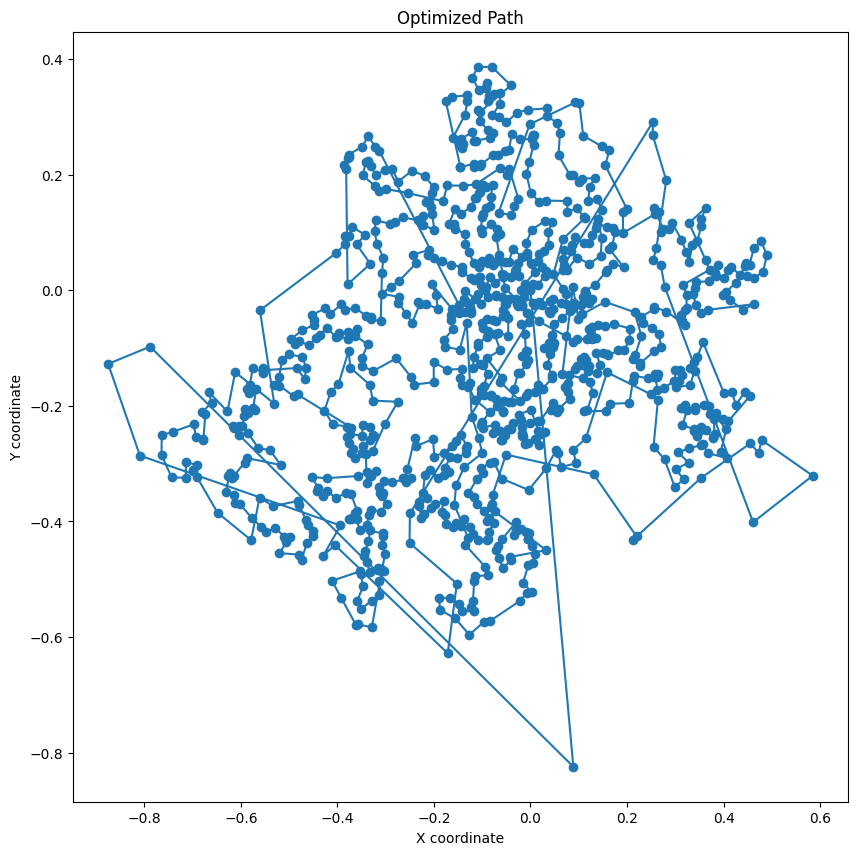

26.350565


In [4]:
# 초기 Value Table 및 Policy 초기화
value_table, policy = initialize_value_policy(num_cities)

# 최적 경로 기반으로 Value Table 및 Policy 업데이트
value_table, policy = update_value_policy(value_table, policy, best_path, coordinates)

# Q Iteration을 사용하여 Q Table 및 Policy 갱신
distance_matrix = cdist(coordinates.numpy(), coordinates.numpy())
initial_q = np.copy(value_table)#value_table 

q_table, policy = q_iteration(distance_matrix, initial_q, episodes=10)

for q in q_table:
    print(q)
#print("Policy:\n", policy)

# policy에 따른 경로 생성 및 시각화
policy_path = generate_path_from_policy(policy)
plot_path(policy_path, coordinates)
print(calculate_cost(policy_path, coordinates))